<h1 style="font-size:30px;">Finetuning YOLOv9 for Instance Segmentation on Custom Dataset</h1>

In this notebook, we will finetune the latest YOLOv9e-seg model on NulnSeg Kaggle dataset.

<img src = "https://learnopencv.com/wp-content/uploads/2024/04/Notebook-Feature-Image-YOLOv9-for-Instance-Segmentation.png" width=1000 height=500>



NulnsSeg Kaggle dataset contains more than 30k manually segmented nuclei from 31 human and mouse organs and 665 image patches extracted from H&E-stained whole slide microscopic images. 

The dataset contains tissues of various human and mouse organs.
Key human and mouse organs include the cerebellum, kidney, liver, pancreas, etc.

The dataset contains a single Nuclei class.

The dataset has `665` images in total so we will split it with an 80:20 train val split ratio.
So, the final split has `532` training and `133` validation images, respectively.


Dependencies

In [1]:
!pip install -q ultralytics pycocotools scikit-learn matplotlib 

Imports

In [1]:
import os
import copy
import random
import json
import yaml
import glob
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from   zipfile import ZipFile
import argparse
from PIL import Image
import PIL.Image
import shutil
from IPython.display import Image
from sklearn.model_selection import train_test_split

import torch
import torch.utils.data
from torch import nn
import torchvision
from ultralytics import YOLO

from torchvision import transforms as T


from pycocotools import mask as coco_mask
from pycocotools.coco import COCO


In [ ]:
def set_seeds():
    # fix random seeds
    SEED_VALUE = 42

    random.seed(SEED_VALUE)
    np.random.seed(SEED_VALUE)
    torch.manual_seed(SEED_VALUE)
    
    if torch.cuda.is_available():
        torch.cuda.manual_seed(SEED_VALUE)
        torch.cuda.manual_seed_all(SEED_VALUE)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = True
        
    
set_seeds()

This function block is used to **download and unzip** the dataset in the specified directory.

In [2]:
def download_and_unzip(url, save_path, extract_dir):
    print("Downloading assets...")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)
    print("Download completed.")

    try:
        if save_path.endswith(".zip"):
            with ZipFile(save_path, 'r') as zip_ref:
                zip_ref.extractall(extract_dir)
            print("Extraction Done")
    except Exception as e:
        print(f"An error occurred: {e}")

DATASET_URL = r"https://www.dropbox.com/scl/fi/u83yuoea9hu7xhhhsgp4d/Nuclei_Instance_Seg.zip?rlkey=7tw3vs4xh7rych4yq1xizd8mh&dl=1"
DATASET_DIR = "Nuclei-Instance-Dataset"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")

# Download and extract if dataset does not exist.
if not os.path.exists(DATASET_DIR):
    os.makedirs(DATASET_DIR, exist_ok=True)  # Ensure the directory exists
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH, DATASET_DIR)
    os.remove(DATASET_ZIP_PATH)  # Remove the zip file after extraction


Download completed.
Extraction Done


## Data Preparation

The dataset comes with many subdirectories. However, for our `YOLOv9e-seg` fine-tuning, we just need the raw images and labeled masks, which we will convert to the appropriate format. 

For our task, we will keep the directories with subdirectories named `‘tissue images’` , `‘mask binary without border’`, and `‘label masks modify’`.


In [4]:
def prune_subdirectories(base_dir,keep_dirs):
    #Iterate through each subdirs in base dir
    for root_dir in os.listdir(base_dir):
        root_path = os.path.join(base_dir,root_dir)
        if os.path.isdir(root_path):
          #  print(f"Processing: {root_path}")
           #List all subdirs inside the current root dir
           for sub_dir in os.listdir(root_path):
               sub_path = os.path.join(root_path, sub_dir)
               #If the subdirectory isn't in the keep list, delete it
               if os.path.isdir(sub_path) and sub_dir not in keep_dirs:
                  # print(f"Deleting: {sub_path}")
                  shutil.rmtree(sub_path)
               elif os.path.isdir(sub_path):
                  # print(f"Keeping: {sub_path}")
                  pass


base_directory = "./Nuclei-Instance-Dataset"
directories_to_keep = ['tissue images', 'mask binary witthout border', 'label masks modify']

prune_subdirectories(base_directory,directories_to_keep)



In [4]:
!sudo apt install tree

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tree is already the newest version (2.0.2-1).
0 upgraded, 0 newly installed, 0 to remove and 13 not upgraded.


After pruning, our dataset tree will look like this:

In [5]:
!tree --dirsfirst -L 2  "Nuclei-Instance-Dataset"

Nuclei-Instance-Dataset
├── human bladder
│   ├── label masks modify
│   └── tissue images
├── human brain
│   ├── label masks modify
│   └── tissue images
├── human cardia
│   ├── label masks modify
│   └── tissue images
├── human cerebellum
│   ├── label masks modify
│   └── tissue images
├── human epiglottis
│   ├── label masks modify
│   └── tissue images
├── human jejunum
│   ├── label masks modify
│   └── tissue images
├── human kidney
│   ├── label masks modify
│   └── tissue images
├── human liver
│   ├── label masks modify
│   └── tissue images
├── human lung
│   ├── label masks modify
│   └── tissue images
├── human melanoma
│   ├── label masks modify
│   └── tissue images
├── human muscle
│   ├── label masks modify
│   └── tissue images
├── human oesophagus
│   ├── label masks modify
│   └── tissue images
├── human pancreas
│   ├── label masks modify
│   ├── tissue images
│   └── Thumbs.db
├── human peritoneum
│   ├── label masks modify
│   └── tissue images
├── human placen

## Convert Label Masks to Yolo Annotations

Next, let’s try to convert our annotations from binary masks to YOLO format. As an intermediate step, let’s convert them to COCO JSON format, which is easy to interpret.

The `get_image_mask_pairs( )` returns all image and mask paths from the dataset appended to a list.


Binary masks are a common way to represent object annotations in segmentation tasks. They efficiently encode the shape of objects at the pixel level. However, for tasks like visualization or calculating object properties, we need to convert these masks into polygons.
`mask_to_polygons( )` shows one such approach to extract polygons from a binary mask.

In [6]:
def get_image_mask_pairs(data_dir):
    image_paths = []
    mask_paths = []

    for root,_,files in os.walk(data_dir):
        if 'tissue images' in root:
            for file in files:
                if file.endswith('.png'):
                    image_paths.append(os.path.join(root,file))
                    mask_paths.append(os.path.join(root.replace('tissue images','label masks modify'), file.replace('.png','.tif')))
    return image_paths, mask_paths

We need to convert our tissue’s binary mask to actionable polygon points. For this, let’s use `cv2.findContours` to extract approximate polygons of the binary mask. This ensures we get a valid closed polygon with more than 4 sides and outlines around mask borders.
By using `cv2.RETR_TREE` as contour retrieval mode, we can reconstruct a hierarchical relationship between all the detected contours.

In [7]:
def mask_to_polygons(mask,epsilon=1.0):
    contours,_ = cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    polygons = []
    for contour in contours:
        if len(contour) > 2:
           poly = contour.reshape(-1).tolist()
           if len(poly) > 4: #Ensures valid polygon
              polygons.append(poly)
    return polygons

## Dataset Preparation

In `process_data( )`, we will initialize annotation and images as empty lists to which we will append all the metadata. Additionally, image ID and ann ID will have zero as initial values.

We will simultaneously iterate through the image_paths and mask_path list we got from the  `get_image_mask_pairs` utility function. For each image, we assign a unique `image_id` by incrementing with 1 after each iteration. Then, we will read our image and mask using opencv. The `cv2.IMREAD_UNCHANGED` helps to read masks, including an alpha channel if present.

For each value representing an object(ignoring background), we construct a binary mask where pixels corresponding to the current unique value are set to 255(white) to highlight the object instance. 

While all other pixels are set to 0(black) effectively isolating the object from the background. The binary mask is then passed as input to the `mask_to_polygons( )` function, which processes the mask and returns a series of polygons.


In [2]:
def process_data(image_paths, mask_paths, output_images_dir, output_labels_dir):
    annotations = []
    images = []
    image_id = 0
    ann_id = 0

    for img_path, mask_path in zip(image_paths, mask_paths):
        image_id += 1
        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
        shutil.copy(img_path, os.path.join(output_images_dir, os.path.basename(img_path)))

        # Add image to the list
        images.append({
            "id": image_id,
            "file_name": os.path.basename(img_path),
            "height": img.shape[0],
            "width": img.shape[1]
        })

        unique_values = np.unique(mask)
        for value in unique_values:
            if value == 0:  # Ignore background
                continue

            object_mask = (mask == value).astype(np.uint8) * 255
            polygons = mask_to_polygons(object_mask)

            for poly in polygons:
                ann_id += 1
                annotations.append({
                  
                    "image_id": image_id,
                    "category_id": 1,  # Only one category: Nuclei
                    "segmentation": [poly],
                   
                })

    coco_input = {
        "images": images,
        "annotations": annotations,
        "categories": [{"id": 1, "name": "Nuclei"}]
    }

    # Convert COCO-like dictionary to YOLO format
    for img_info in coco_input["images"]:
        img_id = img_info["id"]
        img_ann = [ann for ann in coco_input["annotations"] if ann["image_id"] == img_id]
        img_w, img_h = img_info["width"], img_info["height"]

        if img_ann:
            with open(os.path.join(output_labels_dir, os.path.splitext(img_info["file_name"])[0] + '.txt'), 'w') as file_object:
                for ann in img_ann:
                    current_category = ann['category_id'] - 1
                    polygon = ann['segmentation'][0]
                    normalized_polygon = [format(coord / img_w if i % 2 == 0 else coord / img_h, '.6f') for i, coord in enumerate(polygon)]
                    file_object.write(f"{current_category} " + " ".join(normalized_polygon) + "\n")



Now, for each image, a corresponding .txt annotation file is created, and we extract the ‘category_id’ and ‘polygon’ of the current object instance in a recurring loop. The polygon is then normalized relative to the current image dimensions. Thus, a set of .txt files for all images is created in the output labels dir, which will be utilized during fine-tuning.

In [9]:
def create_yaml(output_yaml_path, train_images_dir, val_images_dir, nc=1):
    # Assuming all categories are the same and there is only one class, 'Nuclei'
    names = ['Nuclei']

    # Create a dictionary with the required content
    yaml_data = {
        'names': names,
        'nc': nc,  # Number of classes
        'train': train_images_dir,
        'val': val_images_dir,
        'test': ' '

    }

    # Write the dictionary to a YAML file
    with open(output_yaml_path, 'w') as file:
        yaml.dump(yaml_data, file, default_flow_style=False)


The dataset structure for Yolov9 should look as follows:

<img src="https://learnopencv.com/wp-content/uploads/2024/04/Dataset-Tree-Structure-Finetuning-YOLOv9-for-Instance-Segmentation-.png" >

Now, the `yolo_dataset_preparation( )` function defines all the paths and calls the required set of utility functions. To simply put, this function is responsible for extracting the polygons from the raw binary masks and converting them into YOLO format. Finally, it creates `data.yaml` file for our finetuning.

In [10]:
def yolo_dataset_preparation():
    data_dir = 'Nuclei-Instance-Dataset'
    output_dir = 'yolov9e_1024_dataset'

    # Define the paths for the images and labels for training and validation
    train_images_dir = os.path.join(output_dir, 'train', 'images')
    val_images_dir = os.path.join(output_dir, 'val', 'images')
    train_labels_dir = os.path.join(output_dir, 'train', 'labels')
    val_labels_dir = os.path.join(output_dir, 'val', 'labels')

    # Create the output directories if they do not exist
    os.makedirs(train_images_dir, exist_ok=True)
    os.makedirs(val_images_dir, exist_ok=True)
    os.makedirs(train_labels_dir, exist_ok=True)
    os.makedirs(val_labels_dir, exist_ok=True)

    # Get image and mask paths
    image_paths, mask_paths = get_image_mask_pairs(data_dir)

    # Split data into train and val
    train_img_paths, val_img_paths, train_mask_paths, val_mask_paths = train_test_split(image_paths, mask_paths, test_size=0.2, random_state=42)

    # Process and save the data in YOLO format for training and validation
    process_data(train_img_paths, train_mask_paths, train_images_dir, train_labels_dir)
    process_data(val_img_paths, val_mask_paths, val_images_dir, val_labels_dir)

    # Assume create_yaml function is defined elsewhere and set appropriate paths for the YAML file
    output_yaml_path = os.path.join(output_dir, 'data.yaml')
    train_path = os.path.join('train', 'images')
    val_path = os.path.join('val', 'images')
    create_yaml(output_yaml_path, train_path, val_path)

yolo_dataset_preparation()


## Model Configuration

In [5]:
#Instance
model = YOLO("yolov9e-seg.yaml")#build a model from YAML
model = YOLO("yolov9e-seg.pt") #Transfer the weights from a pretrained model (recommended for training)

**Rerun model initialisation again dill package gets updated**

In [18]:
%cat yolov9e_1024_dataset/data.yaml

names:
- Nuclei
nc: 1
test: ' '
train: train/images
val: val/images


In [19]:
with open("yolov9e_1024_dataset/data.yaml",'r') as stream:
     num_classes = str(yaml.safe_load(stream)['nc'])

## Train the Model

In [20]:
#Define a project --> Destination directory for all results
project = "yolov9e_1024_dataset/results"
#Define subdirectory for this specific training
name = "70_epochs-"


In [21]:
ABS_PATH = os.getcwd()


We will train our models for 70 epochs and save our training logs into the specified project directory.


In [22]:
#Train the model
results = model.train(
    data = os.path.join(ABS_PATH, "yolov9e_1024_dataset/data.yaml"),
    project = project,
    name = name,
    epochs = 70,
    patience = 0 , #setting patience=0 to disable early stopping,
    batch = 3,
    imgsz=1024
)

Ultralytics YOLOv8.1.45 🚀 Python-3.10.14 torch-2.2.2 CUDA:0 (NVIDIA GeForce RTX 4090, 24217MiB)
engine/trainer: task=segment, mode=train, model=yolov9e-seg.pt, data=/1024_v9e_workspace/yolov9e_1024_dataset/data.yaml, epochs=70, time=None, patience=0, batch=3, imgsz=1024, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov9e_1024_dataset/results, name=70_epochs-, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_con

train: Scanning /1024_v9e_workspace/yolov9e_1024_dataset/train/labels.cache... 532 images, 0 backgrounds, 0 corrupt: 100%|██████████| 532/532 [00:00<?, ?it/s]
val: Scanning /1024_v9e_workspace/yolov9e_1024_dataset/val/labels.cache... 133 images, 0 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<?, ?it/s]


Plotting labels to yolov9e_1024_dataset/results/70_epochs-/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 307 weight(decay=0.0), 323 weight(decay=0.0004921875), 322 bias(decay=0.0)
Image sizes 1024 train, 1024 val
Using 8 dataloader workers
Logging results to yolov9e_1024_dataset/results/70_epochs-
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/70      22.3G      1.713      2.719      1.278      1.657        139       1024: 100%|██████████| 178/178 [00:48<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.82it/s]


                   all        133       6958      0.089      0.026     0.0378     0.0193     0.0875     0.0233     0.0356     0.0155

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/70      21.5G      1.783      2.783      1.361      1.689         77       1024: 100%|██████████| 178/178 [00:44<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:09<00:00,  2.32it/s]


                   all        133       6958      0.583      0.508      0.491      0.251       0.57      0.494      0.471      0.214

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/70      21.7G      1.858      2.885      1.395      1.735          9       1024: 100%|██████████| 178/178 [00:44<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:09<00:00,  2.49it/s]


                   all        133       6958      0.669      0.615      0.661      0.327       0.67      0.616      0.658      0.302

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/70      22.9G      1.783      2.859      1.505      1.701        158       1024: 100%|██████████| 178/178 [00:46<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.73it/s]

                   all        133       6958      0.618      0.523      0.569        0.3      0.595      0.501      0.537      0.263



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/70      20.4G      1.752      2.764      1.365      1.675         48       1024: 100%|██████████| 178/178 [00:45<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:11<00:00,  1.94it/s]


                   all        133       6958      0.605      0.588      0.594      0.286      0.591      0.566      0.566      0.251

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/70      20.4G      1.798      2.816       1.32      1.717         43       1024: 100%|██████████| 178/178 [00:46<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:09<00:00,  2.55it/s]


                   all        133       6958      0.547      0.638      0.493      0.241      0.543      0.623       0.48       0.21

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/70      21.3G       1.78       2.77      1.355      1.711         25       1024: 100%|██████████| 178/178 [00:45<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.70it/s]


                   all        133       6958      0.728       0.58      0.659      0.337      0.718      0.567      0.637      0.293

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/70      20.7G      1.717      2.704      1.183      1.637         17       1024: 100%|██████████| 178/178 [00:46<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.74it/s]

                   all        133       6958      0.714      0.624      0.704      0.379      0.708      0.608      0.684      0.336



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/70      23.3G      1.753      2.723      1.257      1.684         45       1024: 100%|██████████| 178/178 [00:44<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.82it/s]

                   all        133       6958      0.752      0.649      0.733      0.379      0.749      0.634      0.719       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/70      19.8G      1.725      2.641      1.232      1.632         47       1024: 100%|██████████| 178/178 [00:45<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.70it/s]

                   all        133       6958       0.75      0.662      0.743      0.401      0.738      0.652      0.725      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/70      21.7G      1.697      2.604      1.188      1.642        139       1024: 100%|██████████| 178/178 [00:45<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.98it/s]


                   all        133       6958      0.741      0.637      0.729      0.387      0.734      0.624      0.709      0.344

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/70      21.8G      1.641      2.535      1.074      1.588         58       1024: 100%|██████████| 178/178 [00:46<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.76it/s]


                   all        133       6958      0.793      0.709      0.796      0.427      0.786      0.697       0.78      0.383

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/70      24.4G      1.635      2.525      1.067      1.579         49       1024: 100%|██████████| 178/178 [00:45<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.93it/s]

                   all        133       6958      0.777      0.695      0.777      0.421      0.774      0.673      0.756      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/70      24.5G      1.655      2.526      1.083      1.604        101       1024: 100%|██████████| 178/178 [00:45<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.88it/s]


                   all        133       6958      0.763      0.698      0.776      0.429      0.759      0.691      0.764      0.395

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/70        22G        1.6      2.466      1.056      1.575         41       1024: 100%|██████████| 178/178 [00:45<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.98it/s]

                   all        133       6958      0.758      0.692      0.769      0.425      0.753      0.676       0.75      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/70      20.8G      1.625      2.465      1.018      1.571         86       1024: 100%|██████████| 178/178 [00:45<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.94it/s]


                   all        133       6958      0.807      0.696      0.791      0.448      0.804      0.687      0.779      0.402

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/70      23.5G      1.614      2.468      1.021      1.578         39       1024: 100%|██████████| 178/178 [00:44<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.88it/s]

                   all        133       6958      0.785      0.699      0.782      0.439      0.781      0.688       0.77      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/70      21.6G      1.646      2.452      1.029      1.595         35       1024: 100%|██████████| 178/178 [00:44<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.01it/s]


                   all        133       6958      0.773        0.7      0.786      0.431      0.767       0.69      0.767      0.375

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/70      20.3G       1.65      2.484      1.094      1.597         25       1024: 100%|██████████| 178/178 [00:44<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]

                   all        133       6958      0.786      0.718      0.802      0.437      0.782      0.709      0.789      0.399



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/70      19.8G      1.619      2.468      1.031      1.591         83       1024: 100%|██████████| 178/178 [00:44<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]

                   all        133       6958      0.798      0.711      0.801      0.436      0.789      0.694      0.778      0.387



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/70      22.5G      1.591      2.444      1.006      1.559        120       1024: 100%|██████████| 178/178 [00:45<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.85it/s]

                   all        133       6958      0.797      0.721      0.807       0.45      0.793      0.713      0.791      0.408



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/70      20.7G      1.599      2.443      1.054      1.563         55       1024: 100%|██████████| 178/178 [00:44<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.02it/s]

                   all        133       6958      0.777      0.723      0.799      0.442      0.771      0.708      0.784      0.394



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/70      22.6G      1.574      2.403     0.9729       1.54         26       1024: 100%|██████████| 178/178 [00:45<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.84it/s]

                   all        133       6958      0.799      0.718      0.806      0.445      0.791      0.709      0.793      0.407



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/70      22.1G      1.606      2.445      1.062      1.588         40       1024: 100%|██████████| 178/178 [00:44<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.98it/s]

                   all        133       6958      0.742      0.623      0.717      0.403       0.74      0.613      0.704      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/70      21.1G      1.578      2.417      1.019       1.54        120       1024: 100%|██████████| 178/178 [00:44<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.09it/s]

                   all        133       6958       0.79      0.708      0.792      0.452      0.786      0.697      0.775      0.404



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/70      22.7G      1.624      2.417     0.9906       1.59         37       1024: 100%|██████████| 178/178 [00:44<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.89it/s]

                   all        133       6958      0.791      0.657      0.752      0.417      0.796      0.643      0.739      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/70      21.5G      1.631      2.407      1.001       1.59         26       1024: 100%|██████████| 178/178 [00:44<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.88it/s]

                   all        133       6958      0.796      0.721      0.807      0.449      0.799      0.703      0.792      0.401



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/70      23.4G      1.629      2.401      1.007      1.592         28       1024: 100%|██████████| 178/178 [00:45<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.94it/s]

                   all        133       6958      0.805      0.731      0.815      0.451      0.805       0.72        0.8      0.402



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/70      20.4G      1.595      2.372     0.9714      1.563         77       1024: 100%|██████████| 178/178 [00:44<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.06it/s]


                   all        133       6958      0.796      0.744      0.821      0.461      0.793       0.73      0.808      0.419

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/70      22.6G      1.567      2.376     0.9704      1.543         24       1024: 100%|██████████| 178/178 [00:45<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]

                   all        133       6958      0.808      0.729      0.818      0.458      0.815       0.71      0.805      0.413



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/70      21.6G      1.543      2.328     0.9195      1.542         63       1024: 100%|██████████| 178/178 [00:44<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]


                   all        133       6958      0.806      0.756      0.832       0.47      0.798      0.745      0.814      0.415

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/70      20.8G      1.527      2.315     0.9371      1.518        116       1024: 100%|██████████| 178/178 [00:44<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.97it/s]

                   all        133       6958      0.802      0.734      0.813      0.465      0.798      0.724      0.798      0.419



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/70      19.5G      1.517      2.299     0.8993       1.51         64       1024: 100%|██████████| 178/178 [00:44<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.93it/s]

                   all        133       6958      0.816      0.731      0.823      0.472      0.819      0.719      0.812      0.428



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/70      23.5G      1.522      2.287     0.8999      1.523         22       1024: 100%|██████████| 178/178 [00:45<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.99it/s]

                   all        133       6958      0.827       0.74       0.83      0.477      0.821      0.731      0.819      0.433



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/70      21.5G      1.512      2.277     0.8962      1.519         73       1024: 100%|██████████| 178/178 [00:44<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.04it/s]

                   all        133       6958      0.827      0.733      0.827      0.466      0.821      0.724      0.815      0.419



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/70      22.2G      1.513      2.277      0.884      1.507         52       1024: 100%|██████████| 178/178 [00:45<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.96it/s]

                   all        133       6958      0.827      0.734      0.829      0.475      0.819      0.727      0.815      0.429



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/70      20.9G      1.532      2.298      0.921      1.533         21       1024: 100%|██████████| 178/178 [00:45<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.19it/s]


                   all        133       6958      0.814      0.735      0.827      0.474      0.813      0.725      0.812      0.434

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/70      24.4G      1.525       2.27     0.9119      1.525         66       1024: 100%|██████████| 178/178 [00:45<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.02it/s]

                   all        133       6958       0.81      0.735      0.827      0.467      0.806      0.719       0.81      0.426



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/70      19.9G      1.551      2.297     0.9098      1.542         13       1024: 100%|██████████| 178/178 [00:45<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.09it/s]

                   all        133       6958      0.813      0.693      0.791      0.451      0.804      0.684      0.774      0.402



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/70        23G      1.517      2.272     0.8833      1.504         55       1024: 100%|██████████| 178/178 [00:44<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]

                   all        133       6958      0.814      0.748      0.836      0.484      0.814      0.735      0.822      0.438



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/70      19.2G      1.508      2.253     0.8839       1.51        200       1024: 100%|██████████| 178/178 [00:44<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]

                   all        133       6958      0.797      0.725      0.811      0.468      0.786      0.715      0.797      0.418



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/70      10.5G      1.511      2.251     0.8852      1.516         26       1024: 100%|██████████| 178/178 [00:45<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.04it/s]

                   all        133       6958      0.815      0.731       0.82      0.476      0.804      0.725      0.804      0.428



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/70      21.5G       1.52      2.271     0.8881      1.516        177       1024: 100%|██████████| 178/178 [00:45<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]

                   all        133       6958      0.821      0.735      0.826      0.475      0.817      0.728      0.817      0.437



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/70      21.2G      1.503      2.237     0.8724      1.524        111       1024: 100%|██████████| 178/178 [00:45<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]

                   all        133       6958      0.823      0.734      0.828      0.481      0.816      0.721      0.813      0.434



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/70      20.1G       1.51      2.247      0.866      1.514         11       1024: 100%|██████████| 178/178 [00:44<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]

                   all        133       6958      0.818      0.728       0.82       0.47      0.818      0.714      0.804      0.422



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/70      24.5G        1.5      2.254     0.8675      1.524         16       1024: 100%|██████████| 178/178 [00:44<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]

                   all        133       6958      0.827      0.729      0.824      0.478       0.82       0.72      0.809      0.432



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/70      21.9G      1.488      2.238     0.8756      1.491         56       1024: 100%|██████████| 178/178 [00:45<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.18it/s]

                   all        133       6958      0.816      0.761      0.843       0.49      0.816      0.748      0.832      0.445



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/70      22.3G      1.483      2.206     0.8565      1.484         57       1024: 100%|██████████| 178/178 [00:44<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.01it/s]

                   all        133       6958      0.822      0.752       0.84      0.484      0.816      0.747      0.832      0.441



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/70      24.2G      1.484      2.212     0.8559       1.49         33       1024: 100%|██████████| 178/178 [00:45<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.92it/s]


                   all        133       6958      0.824      0.753      0.839      0.488      0.817      0.745      0.827      0.447

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/70      19.4G      1.478      2.192     0.8476      1.499         26       1024: 100%|██████████| 178/178 [00:44<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]

                   all        133       6958      0.828      0.738      0.836      0.486      0.824      0.726      0.825      0.447



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      51/70      21.1G      1.473      2.213     0.8549      1.482         27       1024: 100%|██████████| 178/178 [00:45<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.01it/s]


                   all        133       6958      0.818      0.751      0.839      0.482       0.81      0.741      0.827      0.439

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      52/70        20G       1.48      2.195     0.8596      1.495         29       1024: 100%|██████████| 178/178 [00:44<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.00it/s]

                   all        133       6958      0.822      0.762      0.845      0.488      0.814      0.752      0.832      0.444



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      53/70      23.8G      1.469      2.192      0.828      1.479         99       1024: 100%|██████████| 178/178 [00:45<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.09it/s]


                   all        133       6958      0.824      0.732       0.83      0.485      0.813      0.722      0.816      0.442

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      54/70        21G      1.451      2.152     0.8246      1.492         14       1024: 100%|██████████| 178/178 [00:44<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.01it/s]

                   all        133       6958      0.818      0.754      0.836      0.494      0.814      0.749      0.828      0.446



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      55/70      23.3G      1.454      2.163     0.8378      1.471        112       1024: 100%|██████████| 178/178 [00:45<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.94it/s]

                   all        133       6958      0.825      0.769      0.851      0.498      0.827      0.757       0.84      0.452



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      56/70      20.3G      1.464      2.157     0.8248      1.482          4       1024: 100%|██████████| 178/178 [00:44<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.01it/s]

                   all        133       6958      0.822       0.77      0.853      0.501      0.826       0.75      0.841      0.452



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      57/70        22G      1.434       2.14      0.819      1.467         79       1024: 100%|██████████| 178/178 [00:44<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.19it/s]

                   all        133       6958      0.827      0.749       0.84      0.491      0.828      0.735      0.827      0.443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      58/70      20.5G      1.462      2.162     0.8169      1.474         14       1024: 100%|██████████| 178/178 [00:44<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.02it/s]


                   all        133       6958      0.827      0.768      0.849       0.49      0.825      0.756      0.835      0.441

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      59/70      21.6G      1.436      2.119     0.8061       1.45         31       1024: 100%|██████████| 178/178 [00:45<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]


                   all        133       6958      0.823      0.766      0.851      0.498      0.834      0.743      0.839      0.453

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      60/70      19.7G      1.441      2.135     0.8253       1.48         23       1024: 100%|██████████| 178/178 [00:44<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.91it/s]

                   all        133       6958      0.827      0.778      0.857        0.5       0.82      0.765      0.843      0.456


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      61/70      22.6G      1.466      2.174     0.8697      1.533          7       1024: 100%|██████████| 178/178 [00:45<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.63it/s]


                   all        133       6958      0.815      0.751      0.833      0.486      0.809      0.744      0.822       0.44

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      62/70      23.4G      1.442       2.15     0.8537      1.529         44       1024: 100%|██████████| 178/178 [00:43<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.80it/s]


                   all        133       6958       0.83      0.755      0.843      0.497      0.827      0.745      0.833       0.45

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      63/70      18.8G      1.428      2.125     0.8271       1.53         80       1024: 100%|██████████| 178/178 [00:43<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.88it/s]

                   all        133       6958      0.816      0.766      0.845        0.5      0.819      0.754      0.835      0.452



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      64/70      18.5G      1.443      2.134     0.8143      1.508         81       1024: 100%|██████████| 178/178 [00:43<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.82it/s]

                   all        133       6958      0.819      0.772      0.851        0.5      0.821      0.756      0.841      0.456



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      65/70      18.4G      1.423      2.109     0.8103      1.525          7       1024: 100%|██████████| 178/178 [00:43<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.96it/s]


                   all        133       6958      0.824      0.769      0.849        0.5      0.826      0.758      0.838      0.454

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      66/70        20G      1.433      2.107     0.8267        1.5         28       1024: 100%|██████████| 178/178 [00:44<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.98it/s]

                   all        133       6958      0.838      0.755      0.845        0.5      0.828      0.747      0.835      0.452



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      67/70      18.4G      1.421      2.088     0.7933      1.495         32       1024: 100%|██████████| 178/178 [00:43<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        133       6958      0.832      0.761      0.849      0.503      0.833      0.749      0.842      0.459



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      68/70      22.3G      1.434      2.113      0.817      1.511          1       1024: 100%|██████████| 178/178 [00:44<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.77it/s]


                   all        133       6958      0.826      0.771      0.853      0.502      0.824      0.757      0.842      0.455

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      69/70      18.7G      1.418      2.094     0.8014      1.504         16       1024: 100%|██████████| 178/178 [00:43<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.04it/s]

                   all        133       6958      0.837      0.765      0.851      0.503      0.831       0.76       0.84      0.456



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      70/70      18.8G      1.401       2.07     0.7829      1.511         22       1024: 100%|██████████| 178/178 [00:43<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.98it/s]

                   all        133       6958      0.817      0.784      0.856      0.506      0.815      0.774      0.843      0.457



70 epochs completed in 1.096 hours.
Optimizer stripped from yolov9e_1024_dataset/results/70_epochs-/weights/last.pt, 122.0MB
Optimizer stripped from yolov9e_1024_dataset/results/70_epochs-/weights/best.pt, 122.0MB

Validating yolov9e_1024_dataset/results/70_epochs-/weights/best.pt...
Ultralytics YOLOv8.1.45 🚀 Python-3.10.14 torch-2.2.2 CUDA:0 (NVIDIA GeForce RTX 4090, 24217MiB)
YOLOv9e-seg summary (fused): 714 layers, 59682451 parameters, 0 gradients, 244.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:10<00:00,  2.14it/s]


                   all        133       6958      0.819      0.783      0.856      0.506      0.815      0.774      0.843      0.457
Speed: 1.6ms preprocess, 18.3ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to yolov9e_1024_dataset/results/70_epochs-


In [ ]:
%load_ext tensorboard
%tensorboard --logdir yolov9e_1024_dataset/results/70_epochs-

YOLOv9e-seg Training logs

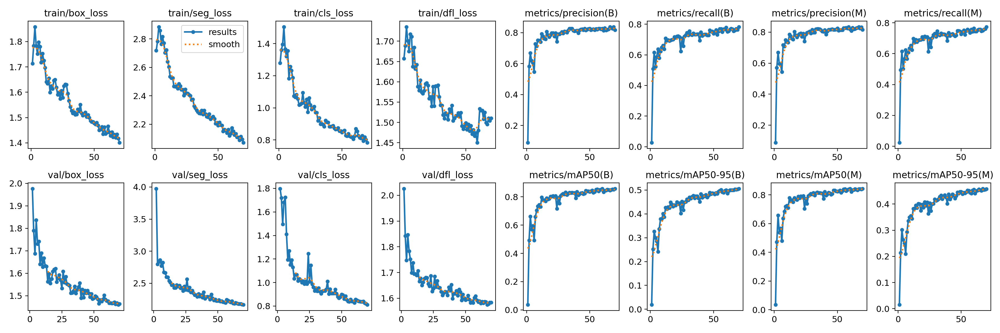

In [24]:
Image("yolov9e_1024_dataset/results/70_epochs-/results.png")

## Inference

The best model weight after training for `70 epochs` is loaded for inference.

In [2]:
inference_model = YOLO('yolov9e_1024_dataset/results/70_epochs-/weights/best.pt')


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_spleen_13.png: 1024x1024 18 Nucleis, 401.1ms
Speed: 12.2ms preprocess, 401.1ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


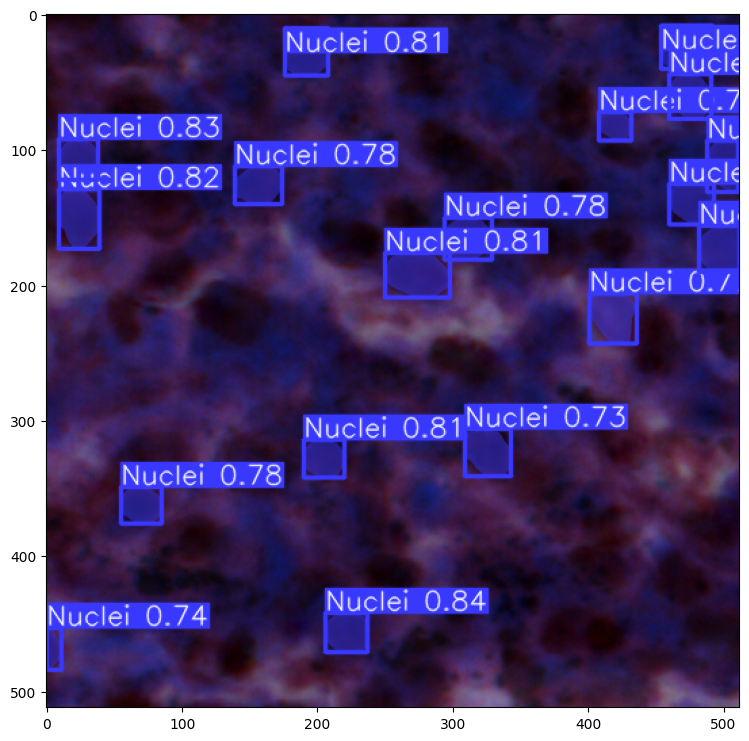

In [153]:
%matplotlib inline
inference_img_path = "yolov9e_1024_dataset/val/images/human_spleen_13.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True,imgsz=1024)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()

The inference_result dictionary has following key attributes:
  
- `boxes`: an object dtype=float32 representing detected bounding box instances. The boxes have following key attributes:
    * `cls`:  a tensor showing class names of all detected objects.

    * `conf`:  a tensor showing on what confidence the model detected those object instances.         
                            
    *  Bounding Box formats(`xywh`, `xywhn`, `xyxy`, `xyxyn`): a tensor having normalized coordinate positions of instances in the inference image.


* `keypoints`: None (for Instance Segmentation task).
   
* `masks` : a object with detected mask instances.The masks have following key attributes:

    - `xy`:  an array with dtype=float32 having each mask’s polygon points location.
                            
* `names` : class mapping of the dataset on which the model is trained.



image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_spleen_07.png: 1024x1024 18 Nucleis, 395.1ms
Speed: 7.9ms preprocess, 395.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict5
[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'Nuclei'}
obb: None
orig_img: array([[[131, 101, 101],
        [123, 101, 104],
        [119, 107, 103],
        ...,
        [131, 124, 132],
        [123, 127, 136],
        [123, 123, 134]],

       [[125, 102,  98],
        [125, 102, 124],
        [123, 105, 125],
        ...,
        [131, 127, 123],
        [125, 129, 122],
        [132, 125, 137]],

       [[133, 102,  98],
        [129, 103, 120],
        [112, 108, 121],
        ...,
        [119, 126, 120],
        

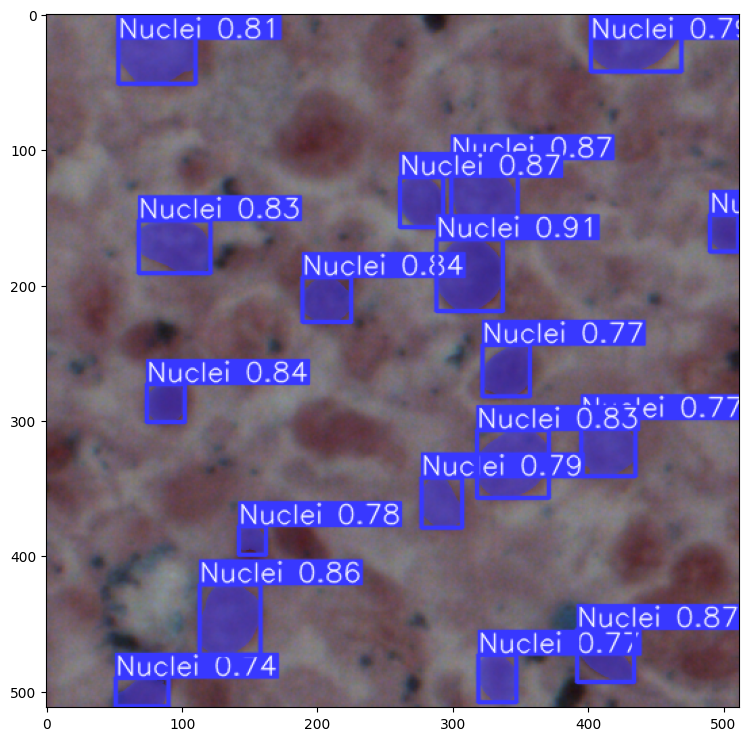

In [26]:
inference_img_path = "yolov9e_1024_dataset/val/images/human_spleen_07.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True,imgsz=1024)

print(inference_result)

print("Boxes:   \n",inference_result[0].boxes)

print("Masks:  \n",inference_result[0].masks)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()

## Custom Plotting Function

We can directly use the Utralytics `plot( )` function for ease of use. However, extracting the masks, boxes, and class names and doing custom plotting is intuitively more beneficial. So, let’s have a look at the custom plotting by making use of the `inference_result` dictionary.

We will filter out detections by `thresholded_indices` with a confidence of more than 0.5. From the outputs, we get the mask and box attributes. We will extract these data to draw segmentation masks and bounding boxes for all predicted instances.



In [42]:
def get_outputs(image, model, threshold=0.5):
    
    # print("Image shape",image.shape)
    outputs = model.predict(image, imgsz=1024, conf=threshold)
    print("Outputs",outputs)

    scores = outputs[0].boxes.conf.detach().cpu().numpy()
    thresholded_indices = [idx for idx, score in enumerate(scores) if score > threshold]
    print(f"Total detections: {len(scores)}, Passed threshold: {len(thresholded_indices)}")

    if len(thresholded_indices) > 0:
        masks = [outputs[0].masks.xy[idx] for idx in thresholded_indices]
        boxes = outputs[0].boxes.xyxy.detach().cpu().numpy()[thresholded_indices]
        boxes = [[(int(box[0]), int(box[1])), (int(box[2]), int(box[3]))] for box in boxes]
        labels = [outputs[0].names[int(outputs[0].boxes.cls[idx])] for idx in thresholded_indices]
    else:
        masks, boxes, labels = [], [], []

    return masks, boxes, labels

The `draw_segmentation_map` function overlays, predicted masks onto the original image with `cv2.fillPoly( )` and `cv2.addWeighted( )`.

In [43]:
def draw_segmentation_map(image, masks, boxes, labels):
    alpha = 1.0
    beta = 0.5  # Transparency for the segmentation map
    gamma = 0  # Scalar added to each sum
    image = np.array(image)  # Convert the original PIL image into a NumPy format
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)  # Convert from RGB to OpenCV BGR format

    for mask, box, label in zip(masks, boxes, labels):
        color = (0, 255, 0)  # Green color for visualization
        segmentation_map = np.zeros_like(image)

        if mask is not None and len(mask) > 0:
            poly = np.array(mask, dtype=np.int32)
            cv2.fillPoly(segmentation_map, [poly], color)

        cv2.addWeighted(image, alpha, segmentation_map, beta, gamma, image)
        cv2.rectangle(image, box[0], box[1], color=(255, 0, 0), thickness=2)  # Red color for bounding box

    return image

0: 1024x1024 53 Nucleis, 396.3ms
Speed: 23.7ms preprocess, 396.3ms inference, 10.2ms postprocess per image at shape (1, 3, 1024, 1024)
Outputs [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'Nuclei'}
obb: None
orig_img: array([[[ 98,  60, 131],
        [ 98,  60, 146],
        [ 97,  61, 124],
        ...,
        [ 84,  42,  85],
        [ 87,  41,  70],
        [ 81,  38,  71]],

       [[ 98,  59, 129],
        [ 98,  59, 127],
        [ 99,  59, 132],
        ...,
        [ 84,  40,  63],
        [ 86,  40,  56],
        [ 81,  37,  55]],

       [[101,  61, 125],
        [101,  60, 134],
        [100,  60, 120],
        ...,
        [ 84,  42,  87],
        [ 85,  41,  68],
        [ 80,  40,  68]],

       ...,

       [[102,  58,  80],
        [103,  55,  87],
        [104,  56,  75],
        ...,
        [ 58,  18,  36],
        [ 55,  18,  47],

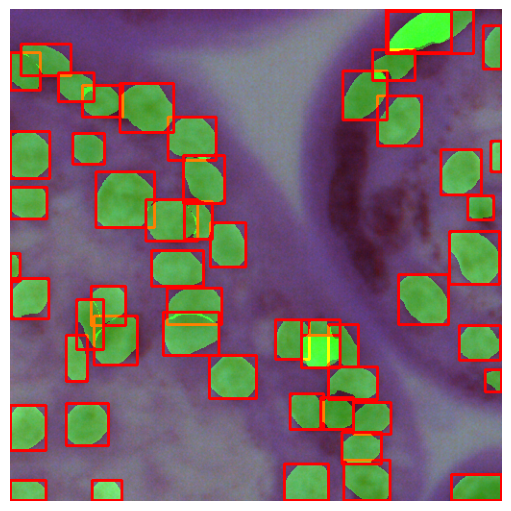

In [47]:
fig = plt.figure(figsize=(5, 5), layout="constrained")
image_path = "yolov9e_1024_dataset/val/images/human_placenta_24.png"
image = PIL.Image.open(image_path)
orig_image = image.copy()  # Keep a copy of the original image for OpenCV functions and applying masks

masks, boxes, labels = get_outputs(image, inference_model, threshold=0.5)
result = draw_segmentation_map(orig_image, masks, boxes, labels)

save_path = f"./inference/nuclei_instance_out{image_path.split(os.path.sep)[-1].split('.')[0]}.jpg"
cv2.imwrite(save_path, result)

plt.imshow(result)

plt.axis('off')
plt.show()



image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_bladder_03.png: 1024x1024 11 Nucleis, 287.9ms
Speed: 5.9ms preprocess, 287.9ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict4


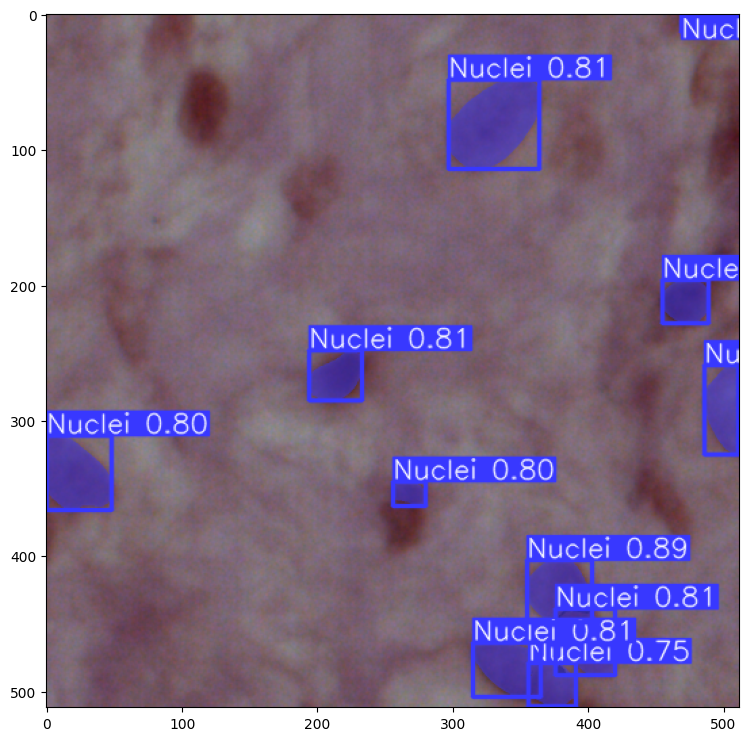

In [17]:
%matplotlib inline
inference_img_path = "yolov9e_1024_dataset/val/images/human_bladder_03.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_cerebellum_6.png: 1024x1024 55 Nucleis, 399.4ms
Speed: 8.2ms preprocess, 399.4ms inference, 8.8ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


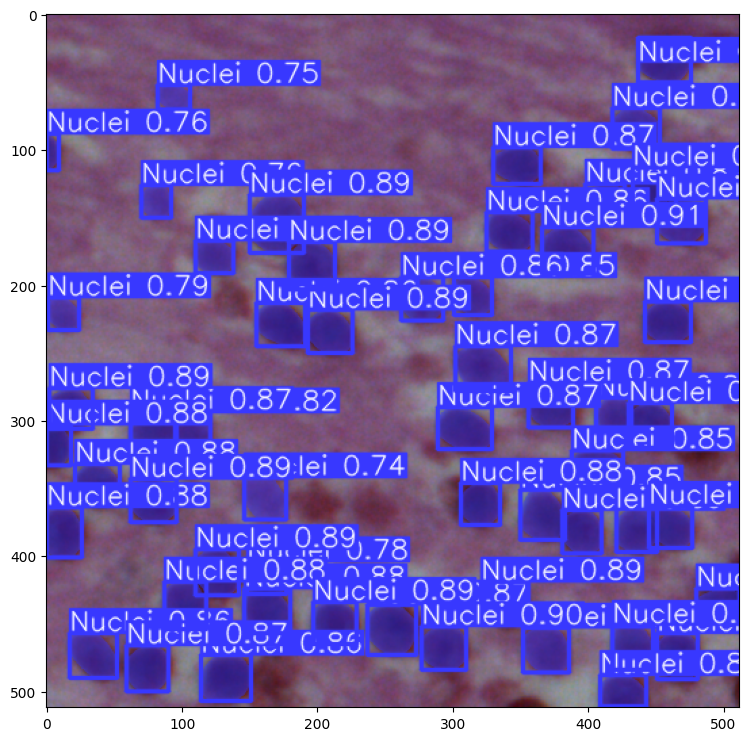

In [159]:
inference_img_path = "yolov9e_1024_dataset/val/images/human_cerebellum_6.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_epiglottis_4.png: 1024x1024 5 Nucleis, 402.2ms
Speed: 11.2ms preprocess, 402.2ms inference, 2.5ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


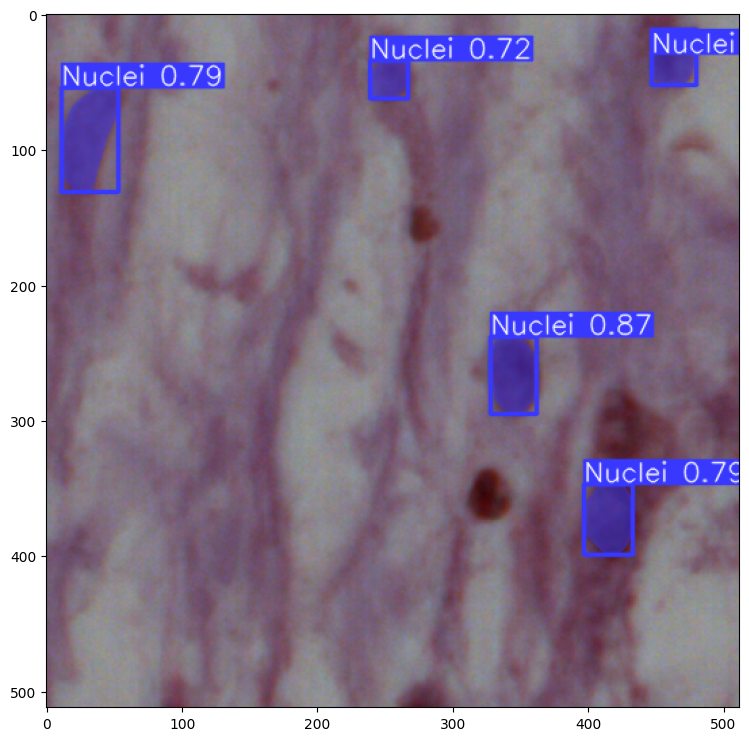

In [160]:
inference_img_path = "yolov9e_1024_dataset/val/images/human_epiglottis_4.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_jejunum_02.png: 1024x1024 37 Nucleis, 400.4ms
Speed: 7.1ms preprocess, 400.4ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


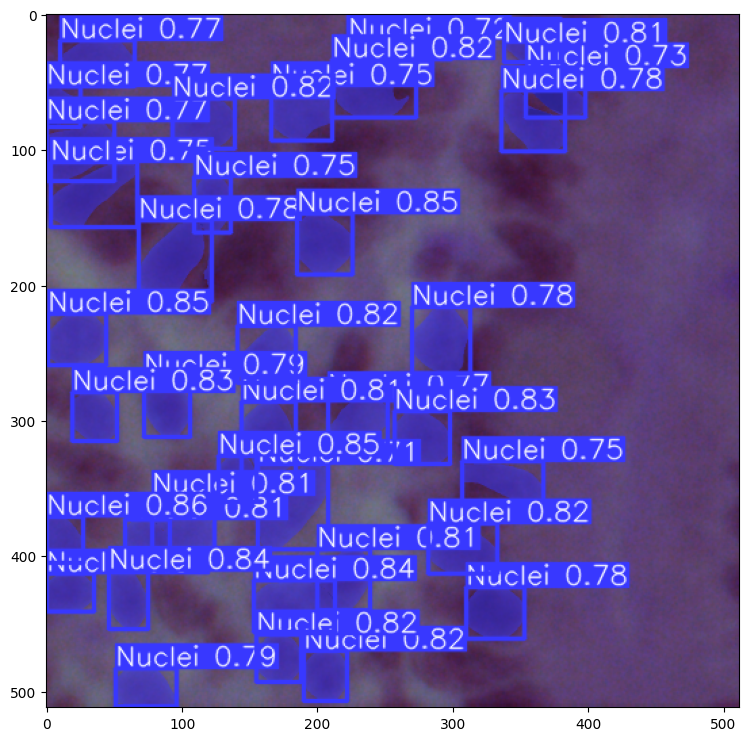

In [161]:
inference_img_path = "yolov9e_1024_dataset/val/images/human_jejunum_02.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_kidney_01.png: 1024x1024 46 Nucleis, 400.3ms
Speed: 7.0ms preprocess, 400.3ms inference, 7.7ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


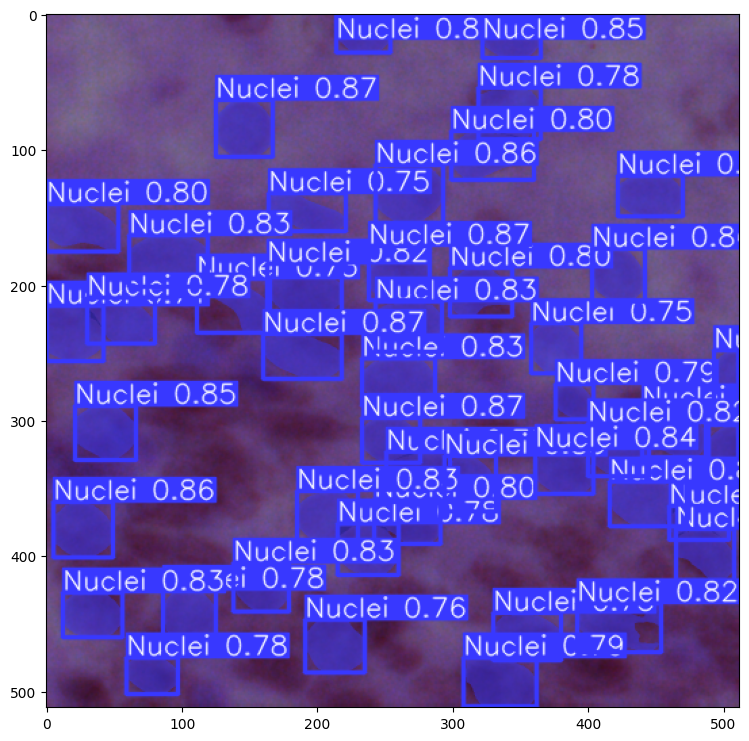

In [162]:
inference_img_path = "yolov9e_1024_dataset/val/images/human_kidney_01.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_liver_22.png: 1024x1024 28 Nucleis, 400.2ms
Speed: 6.7ms preprocess, 400.2ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


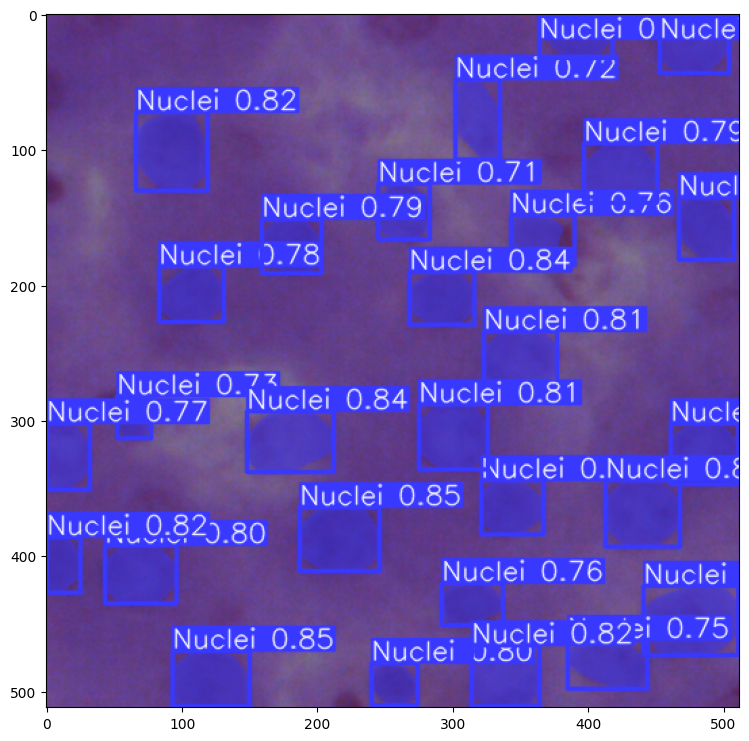

In [163]:
inference_img_path = "yolov9e_1024_dataset/val/images/human_liver_22.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_melanoma_03.png: 1024x1024 15 Nucleis, 401.7ms
Speed: 6.9ms preprocess, 401.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


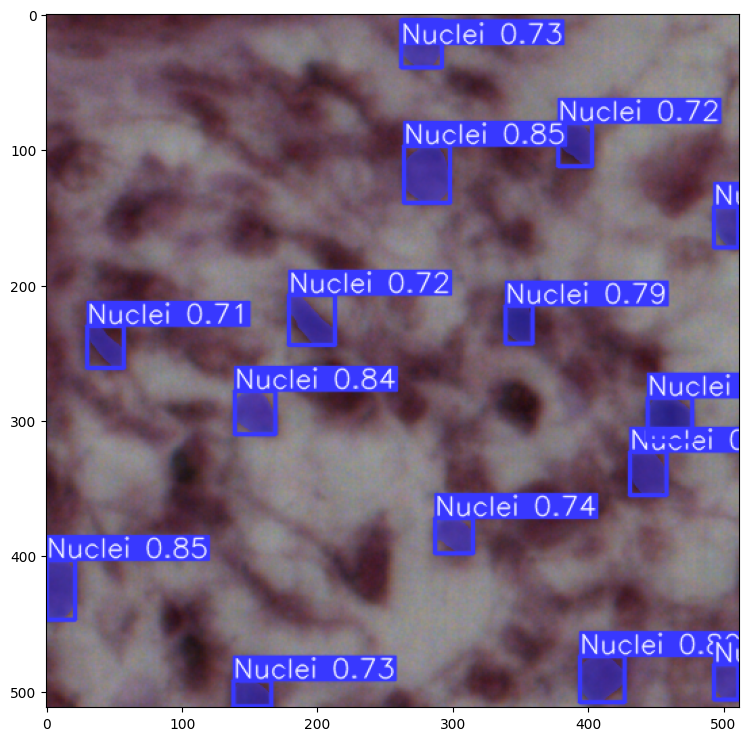

In [164]:
inference_img_path = "yolov9e_1024_dataset/val/images/human_melanoma_03.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_pancreas_11.png: 1024x1024 29 Nucleis, 401.6ms
Speed: 8.4ms preprocess, 401.6ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


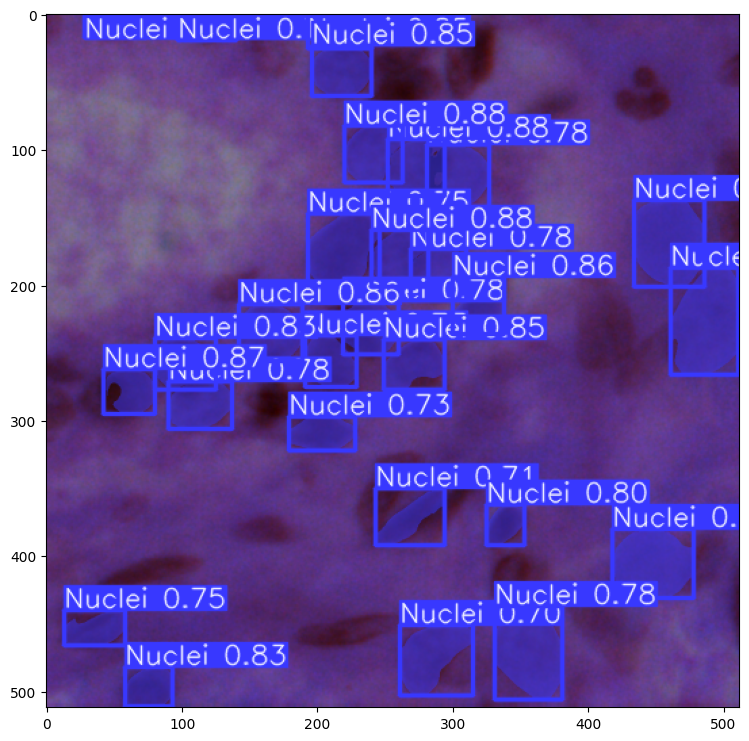

In [165]:
inference_img_path = "yolov9e_1024_dataset/val/images/human_pancreas_11.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,visualize=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_peritoneum_3.png: 1024x1024 13 Nucleis, 402.1ms
Speed: 7.6ms preprocess, 402.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


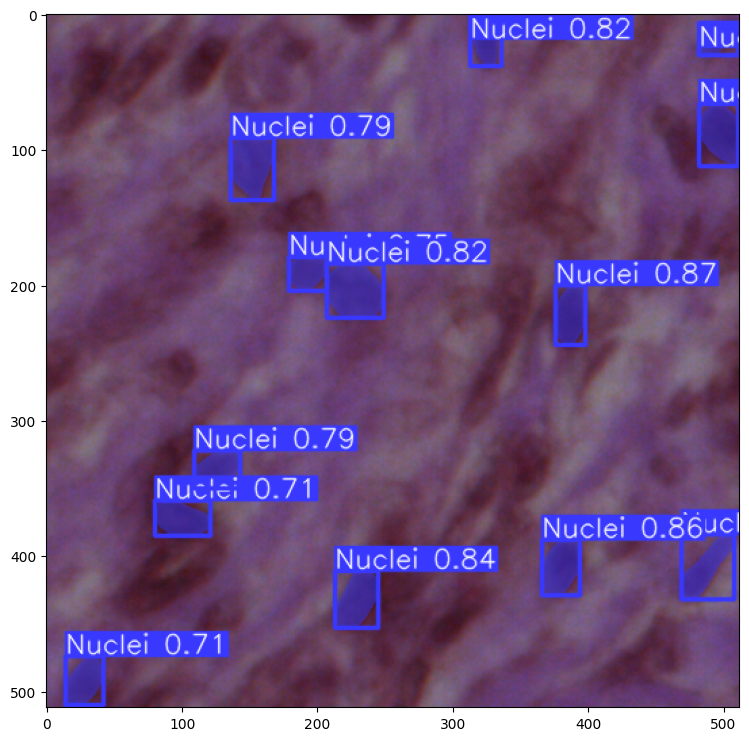

In [166]:
inference_img_path = "yolov9e_1024_dataset/val/images/human_peritoneum_3.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_tongue_28.png: 1024x1024 28 Nucleis, 303.5ms
Speed: 14.6ms preprocess, 303.5ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


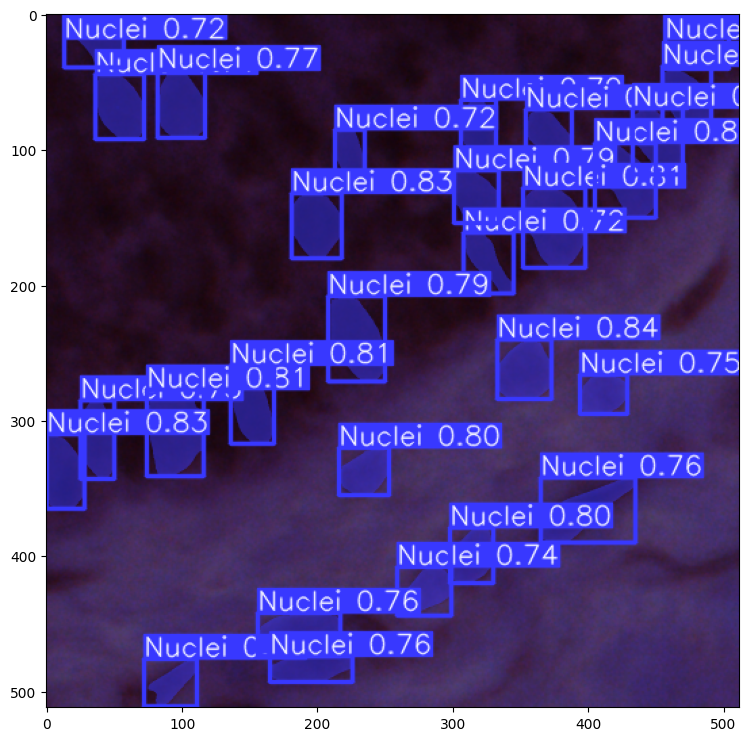

In [174]:
%matplotlib inline
inference_img_path = "yolov9e_1024_dataset/val/images/human_tongue_28.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True,imgsz=1024)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_oesophagus_07.png: 1024x1024 34 Nucleis, 340.0ms
Speed: 32.8ms preprocess, 340.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


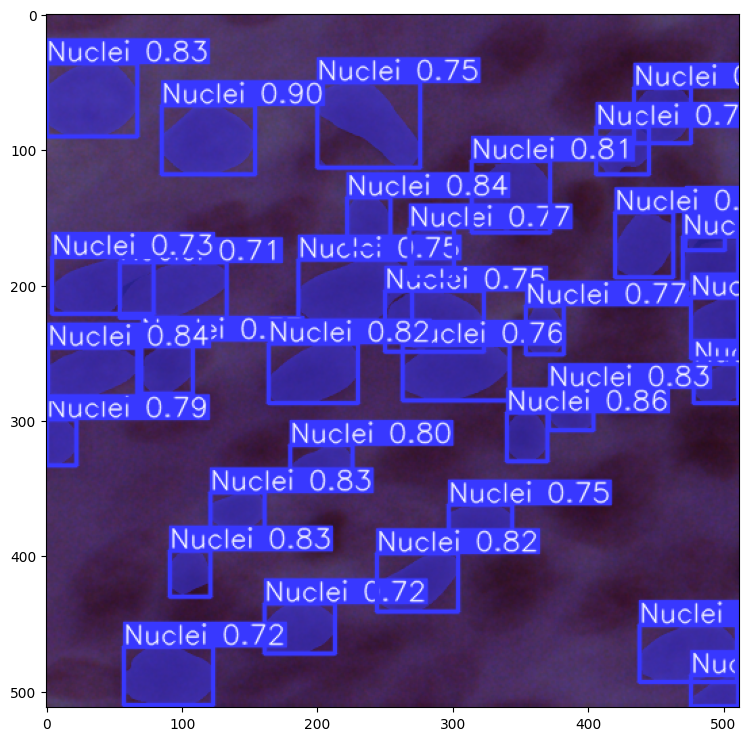

In [176]:
%matplotlib inline
inference_img_path = "yolov9e_1024_dataset/val/images/human_oesophagus_07.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,imgsz=1024,show_boxes=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov9e-1024/1024_v9e_workspace/024_v9e_workspace/yolov9e_1024_dataset/val/images/human_salivory_23.png: 1024x1024 34 Nucleis, 342.7ms
Speed: 20.3ms preprocess, 342.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict2


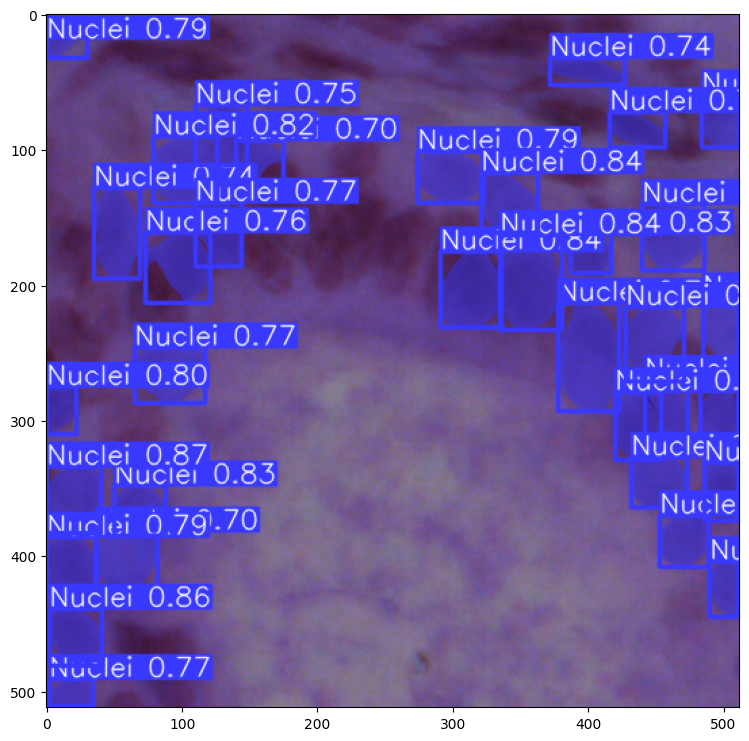

In [175]:
%matplotlib inline
inference_img_path = "yolov9e_1024_dataset/val/images/human_salivory_23.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,imgsz=1024,show_boxes=False,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)
plt.show()

If you are training on colab,move training logs to drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
import shutil

# Define the paths
source_dir = '/content/yolov9_dataset'
destination_dir = '/content/drive/MyDrive/Yolov9e_exp'

# Copy the directory to Google Drive
shutil.copytree(source_dir, destination_dir)


'/content/drive/MyDrive/Yolov9e_exp'